#### Data Wrangling
    * Data Wrangling is process of converting & formatting data from raw form to usable format down to data science pipeline.
    
    data outlier: before any analytics we need to find outliers. and the steps mentioned here for data outlier. If we do not find outliers in our data our data result and analytics will be biased. Finding data outlier is a must.

In [2]:
import pandas as pd
import numpy as np

In [7]:
auto_price = pd.read_csv('Automobile_price_data__Raw_.csv')
display(auto_price)
auto_price.dtypes


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470


symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                 object
dtype: object

In [8]:
# this line updates question marks with np.nan, 
# inplace = True will update my dataset. Which mean from now on whenever I read my dataset, no question marks will be 
#seen. 
# We are solving data issues/ we are wrangelling / manupolating data

auto_price.replace('?', np.nan, inplace = True)



In [11]:
# second issue needs to be solved is to converet numerical columns that has changed to 'object' data type 
#due to presence of ?, to numerical using pd.to_numeric() function.

cols =  ['normalized-losses','bore','stroke','horsepower','peak-rpm','price']
auto_price[cols] = auto_price[cols].apply(pd.to_numeric)
auto_price.dtypes

symboling              int64
normalized-losses    float64
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                 float64
stroke               float64
compression-ratio    float64
horsepower           float64
peak-rpm             float64
city-mpg               int64
highway-mpg            int64
price                float64
dtype: object

In [12]:
# check the number of missing values.

auto_price.isnull().sum()

symboling             0
normalized-losses    41
make                  0
fuel-type             0
aspiration            0
num-of-doors          2
body-style            0
drive-wheels          0
engine-location       0
wheel-base            0
length                0
width                 0
height                0
curb-weight           0
engine-type           0
num-of-cylinders      0
engine-size           0
fuel-system           0
bore                  4
stroke                4
compression-ratio     0
horsepower            2
peak-rpm              2
city-mpg              0
highway-mpg           0
price                 4
dtype: int64

In [7]:
# since the muber of missing values in the 'normalized-losses' column is larg, (41 missing) we replace the
#missing values with mean.


In [15]:
#First we see data type of normalized-losess

auto_price['normalized-losses']

0        NaN
1        NaN
2        NaN
3      164.0
4      164.0
       ...  
200     95.0
201     95.0
202     95.0
203     95.0
204     95.0
Name: normalized-losses, Length: 205, dtype: float64

In [16]:
# #data is integer. You can replace missing values with fillna and replace
#you can do it with fillna() of fillna() function.
# non of my codes fillna and replace functions do not work because I guess they have already executed. Because 
#when I 
# run this code auto_price.isnull().sum() to see missing vlaues of the 'normalized-losses', in the lines below, 
#the output
#does not show any missing for this column.

auto_price['normalized-losses'].fillna(np.round(auto_price['normalized-losses'].mean(),0))

0      122.0
1      122.0
2      122.0
3      164.0
4      164.0
       ...  
200     95.0
201     95.0
202     95.0
203     95.0
204     95.0
Name: normalized-losses, Length: 205, dtype: float64

In [17]:

# 1- doing it with replace


auto_price['normalized-losses'].replace(np.nan, auto_price['normalized-losses'].mean(), inplace = True)

In [ ]:
auto_price.isnull().sum()

In [20]:
# using code belows shows us that replce and fillna function has worked and there is no missing values in 'normalized-losses' column
# we see no miising values for the other columns like price as well as in the cells below teacher has ran auto_price.dropna(inplace = True) which
#drops rest of the missing values in the other columns like price and more. So, 
# In generall, we use the code below to see num of missing value in any columns.
# the code below shows that code above removed all the missing values of normalized-losses column replaced with mean and there
#no missing values. but there is missing values in other columns like price.


auto_price.isnull().sum()


symboling            0
normalized-losses    0
make                 0
fuel-type            0
aspiration           0
num-of-doors         0
body-style           0
drive-wheels         0
engine-location      0
wheel-base           0
length               0
width                0
height               0
curb-weight          0
engine-type          0
num-of-cylinders     0
engine-size          0
fuel-system          0
bore                 0
stroke               0
compression-ratio    0
horsepower           0
peak-rpm             0
city-mpg             0
highway-mpg          0
price                0
dtype: int64

In [23]:
# since missing values  of other numerical column like 'price' and 'other columns like 'stroke', and 'bore' are
#small like 
# 2 or 4 missing values, we drop them with this code and by inplace = True we update our data.

auto_price.dropna(inplace = True)
auto_price.isnull().sum()

symboling            0
normalized-losses    0
make                 0
fuel-type            0
aspiration           0
num-of-doors         0
body-style           0
drive-wheels         0
engine-location      0
wheel-base           0
length               0
width                0
height               0
curb-weight          0
engine-type          0
num-of-cylinders     0
engine-size          0
fuel-system          0
bore                 0
stroke               0
compression-ratio    0
horsepower           0
peak-rpm             0
city-mpg             0
highway-mpg          0
price                0
dtype: int64

In [24]:
auto_price.isnull().sum()

symboling            0
normalized-losses    0
make                 0
fuel-type            0
aspiration           0
num-of-doors         0
body-style           0
drive-wheels         0
engine-location      0
wheel-base           0
length               0
width                0
height               0
curb-weight          0
engine-type          0
num-of-cylinders     0
engine-size          0
fuel-system          0
bore                 0
stroke               0
compression-ratio    0
horsepower           0
peak-rpm             0
city-mpg             0
highway-mpg          0
price                0
dtype: int64

#### Central Tendancy

In [25]:
# Most Frequent Data

auto_price['body-style'].mode()

0    sedan
dtype: object

In [26]:
auto_price['make'].value_counts()

toyota           32
nissan           18
honda            13
mitsubishi       13
volkswagen       12
subaru           12
mazda            12
volvo            11
peugot           11
bmw               8
dodge             8
mercedes-benz     8
plymouth          7
saab              6
audi              6
porsche           4
alfa-romero       3
jaguar            3
chevrolet         3
isuzu             2
mercury           1
Name: make, dtype: int64

In [11]:
# Median (50th Percentile)
auto_price['price'].median()

10245.0

In [29]:
auto_price['price'].var()

65433261.93161697

In [28]:
auto_price['price'].std()

8089.082885693345

#### Summary of Dataset

In [27]:
# summary of dataset incldes count, mean, std, ....max.
#in the output below, twentry five percentile) 25% is know as quartile one, seventy five percentile (75%), quartile three. 
#these quatile says if our data has certain outlier.

auto_price.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000,193.000000
mean,0.797927,121.284974,98.923834,174.326425,65.893782,53.869948,2561.507772,128.124352,3.330622,3.248860,10.143627,103.481865,5099.740933,25.326425,30.787565,13285.025907
std,1.235582,32.342674,6.152409,12.478593,2.137795,2.394770,526.700026,41.590452,0.272385,0.315421,3.977491,37.960107,468.694369,6.387828,6.816910,8089.082886
min,-2.000000,65.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,0.000000,95.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,98.000000,3.150000,3.110000,8.500000,70.000000,4800.000000,19.000000,25.000000,7738.000000
50%,1.000000,122.000000,97.000000,173.200000,65.400000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5100.000000,25.000000,30.000000,10245.000000
75%,2.000000,134.000000,102.400000,184.600000,66.900000,55.700000,2952.000000,146.000000,3.590000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16515.000000
max,3.000000,256.000000,120.900000,208.100000,72.000000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,262.000000,6600.000000,49.000000,54.000000,45400.000000


Histogram is something like pluting the distribution of samples. 

We have a lot of continous data. Using this 
we will try to make distribtion of samples.

We have a range of data ( we use {} for range) that begins with one and goes to 50. 

Range of data equals 1 to 50.

I want to spilt  data  into 6. so number of splits are 6.

To create a histogram I need to ensure  that I have a plot within a range and frequency. 

This is a plot within range

when I write a program to display a plot, i use terminology that is called bin. Bin is number of splits.

for the given range I want to dicide to 6. So in one side I have range in the other side I have frequency. so it plots between range and frequency.


age = {1,5,7,12,15,17,21,25,32,35,41,45,45,45,50}
range is from 
1-10
10-20
20-30
...
50-60

in the first range, 1-10, 10 will not be included. 10 is limit, it will include any value lower than 10 which is 9. And so  for the rest of ranges.

okay to see the frequncy of the age based on the range. frequncy of the age based on the first range which is 0 - 10, is 3. And we can calculate the frequency of first range with counting the numbers which are less than 10, they are 1,5,7. So frequency of age for the second range is 3, we find it by counting numbers that are less than 20. because the second range is between 10-20. to find the frequency of each range we count the value of age.


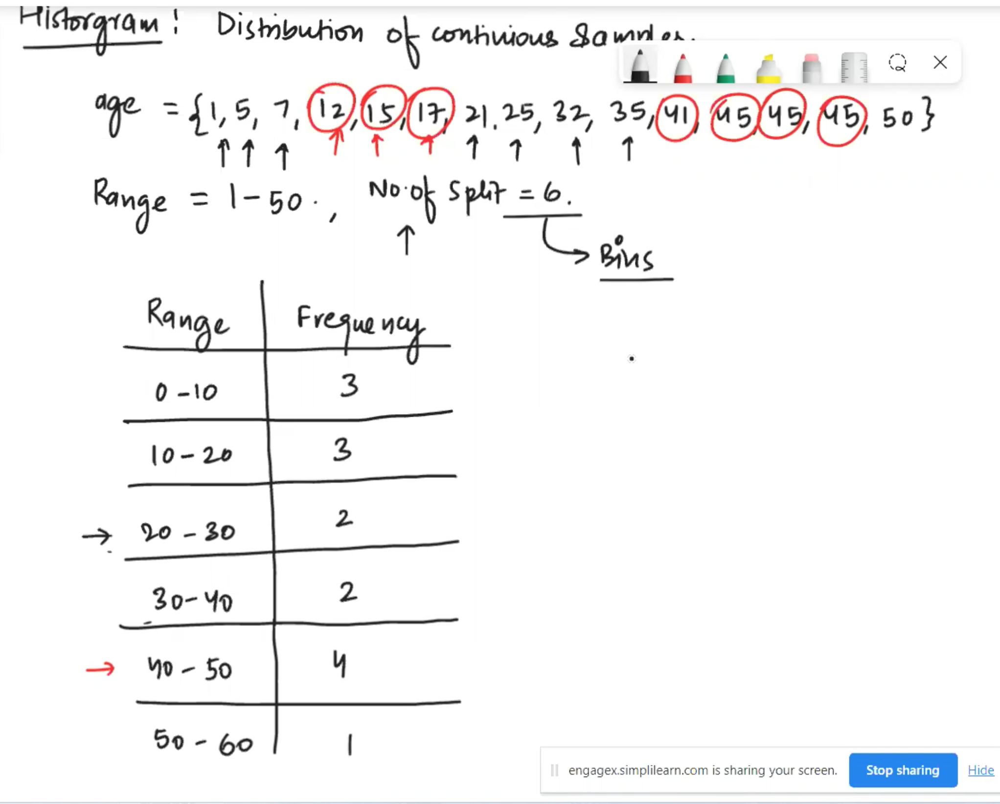

How does convert it into a histogram plot.


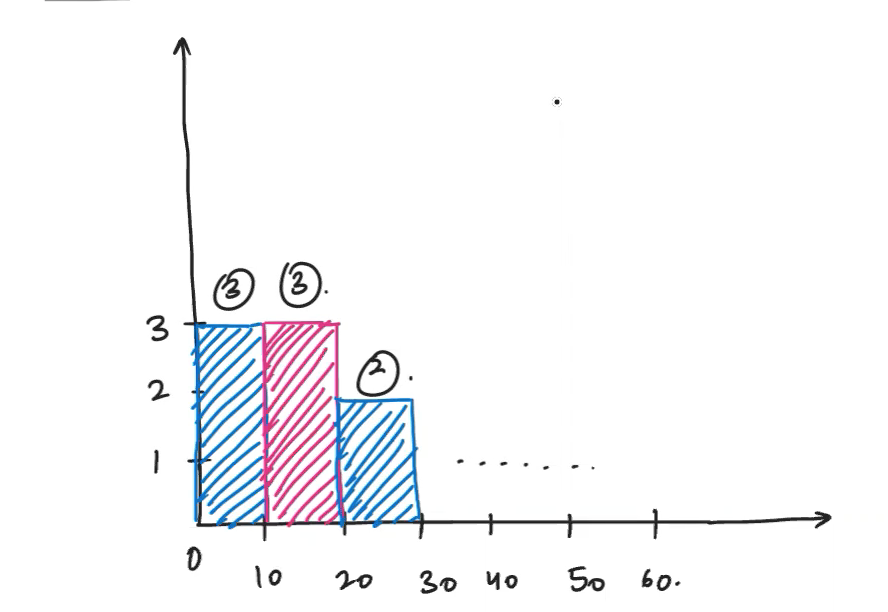

So this plot gives you an idea of distribution of data , age.


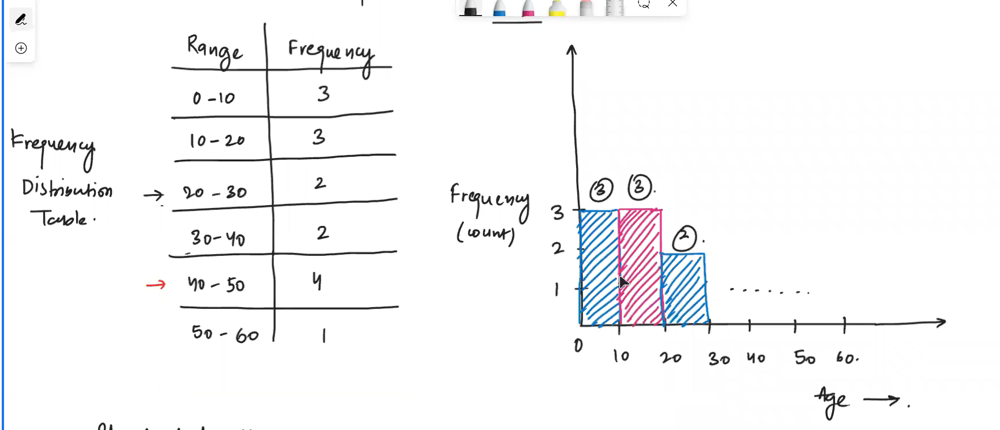

What does this data is telling you. 

Let's talk about variance and standard deviation.


STD:
whatever we do we assum we are doing it on a  smaple of large dataset and we are doing our statistical analysis on the sample of data.

one of the prime distribution is normal distribution.


We have two differnt  probablity of distribution.
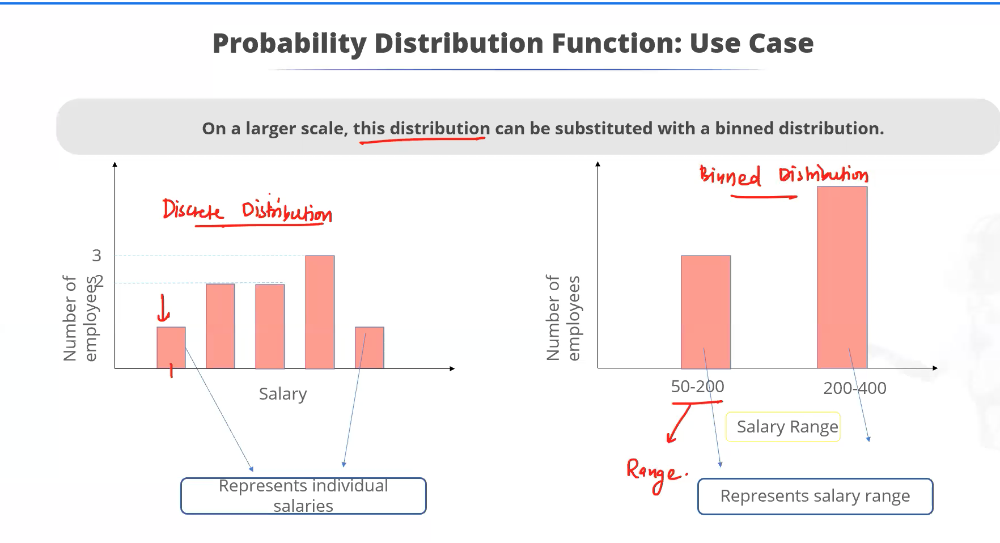



probablity of sum of 1. probablity ranges from 0-1. [probablity for different ranges will be toghetrher 1]
prpbability of alll outcome is always equal to 1. Sum of probablity is 1.

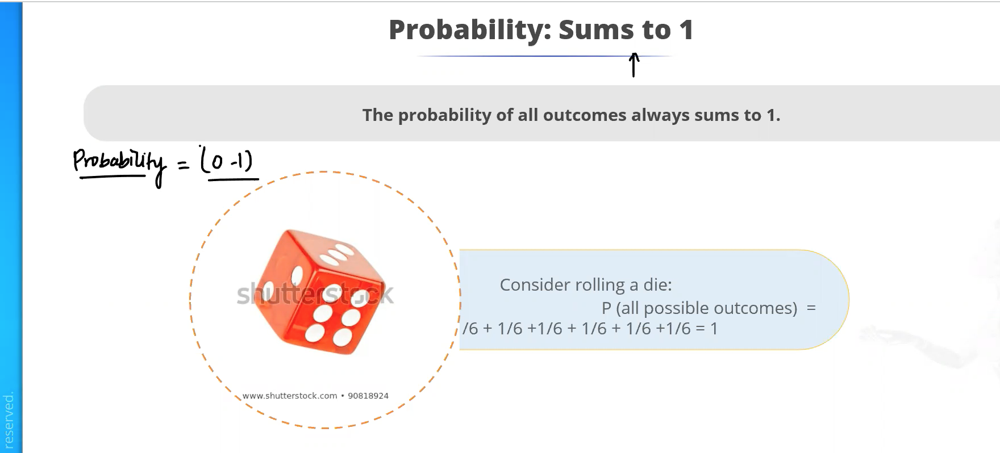


Probablity Terminology
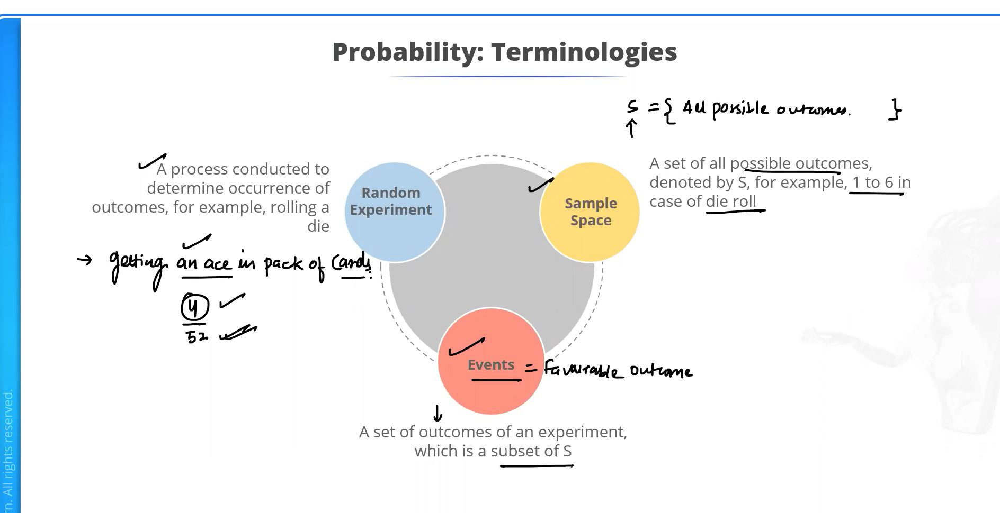


Probablity Distribution: What it is?
probbilty distribution is probablity of values for random variable.

probability function:

#there are two part for probabity distribution:
1- discrete where we talk about numerical values. 

Example of discrete probabity/ problem to be solved:
is when you are going to cacluate prob...y of persons who will buy vanila icecream  compared to the overal number of icecream purchased.
th way we calculate it is dividing the number of people buying vanila ice cream by the total number of people buying whol differnt falvour of ice cream.
if you have plotting like the one below, it is a discrete probability. Like when you want to know probablity of the people who buys vanila icecream; 
in the plot you have different values, sum them you will get total number if elements/values.
if you divide total number of the persons who bought vanila divided by ovral values of icecream purchased  will get probablity of dicsrete number in the example below.
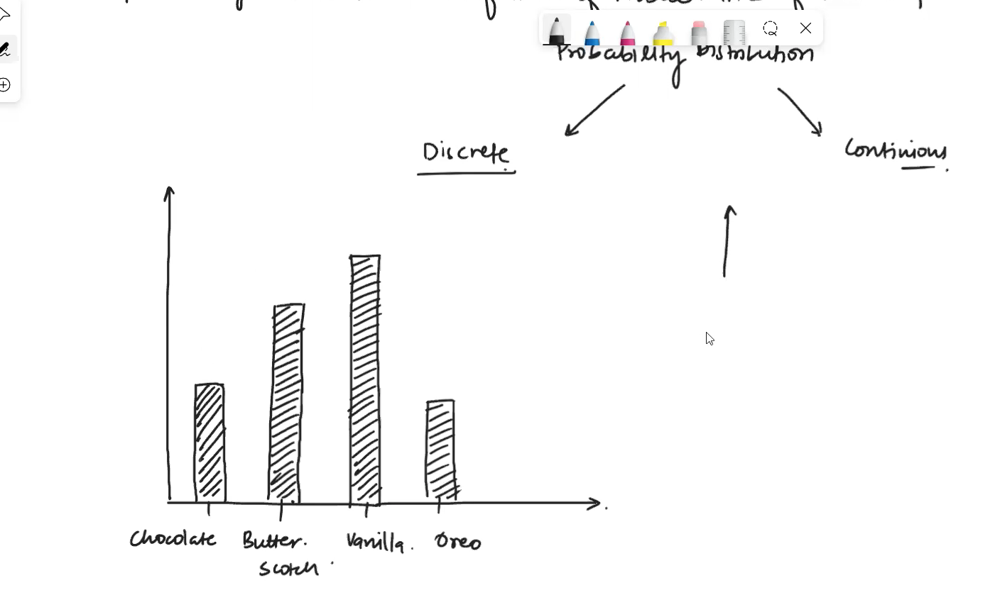


2- continous. It is very important distribution, one of the contious distributin is normal distribution.
example and problem to be solved  is like when you are going to calculate probaliry of students scoring marks beween 40 to 60. 
how do we calculate it: 

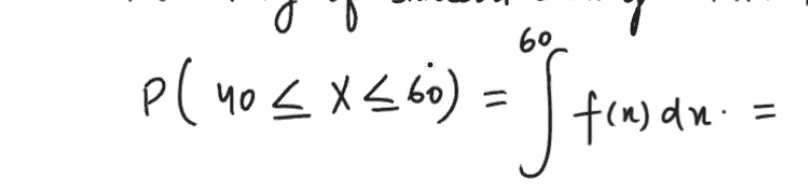


the answer of the below formula is the area between a and b,  


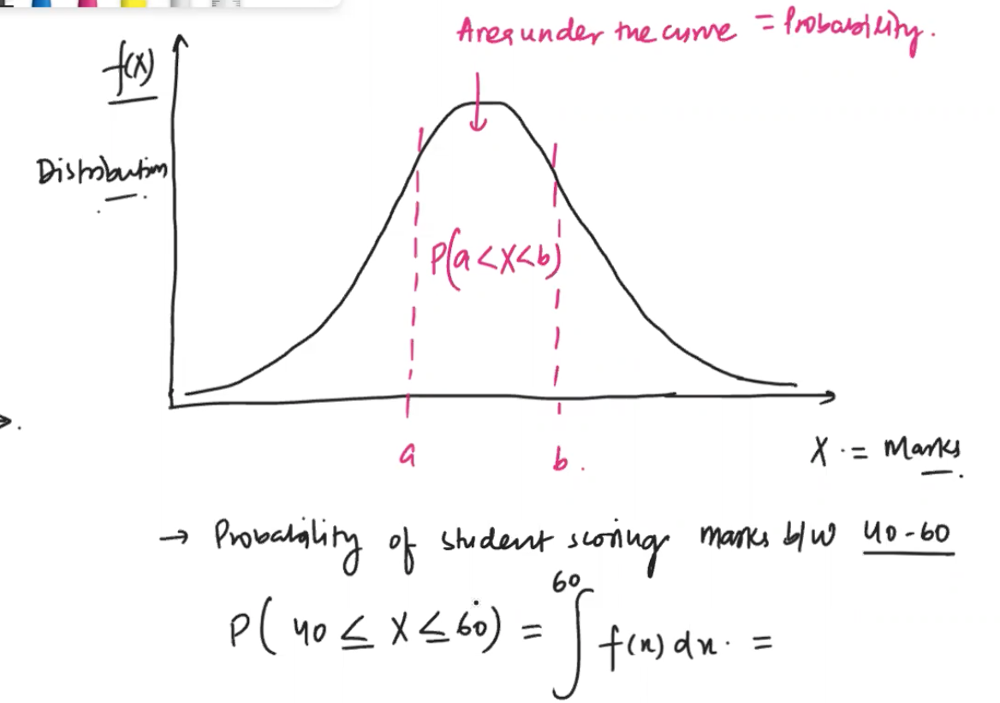

For continous to know the probablity you need to know the area under the curve.
plot in this type of probablity is like this:
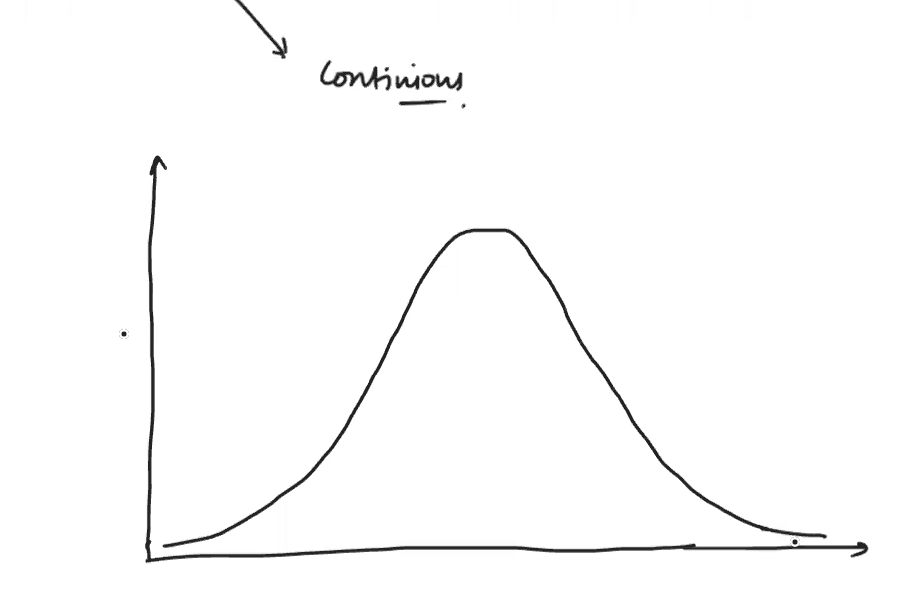



in this we will talk about range.
probablity is the area under the curve between 0 and 1.

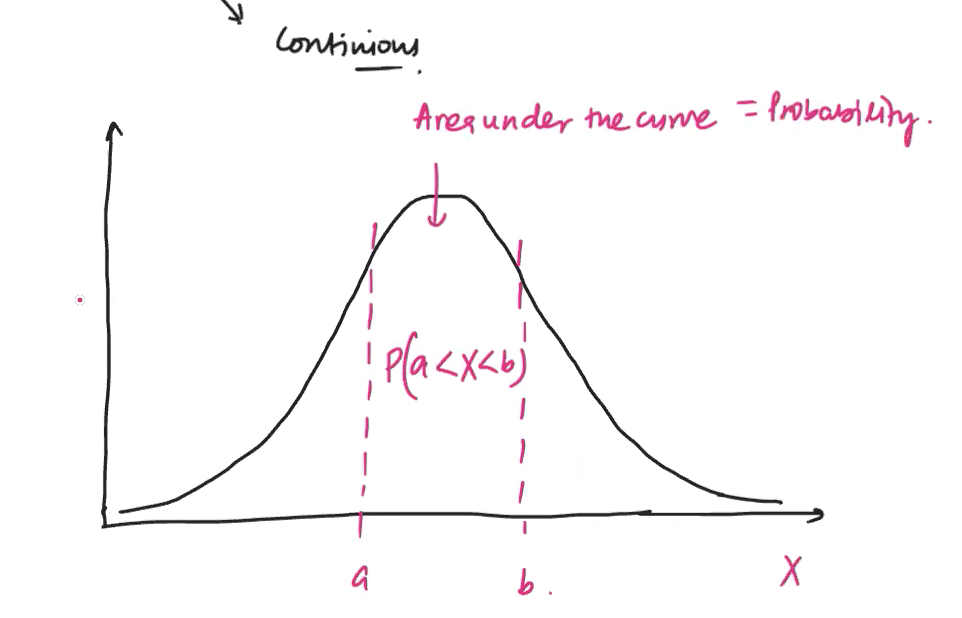

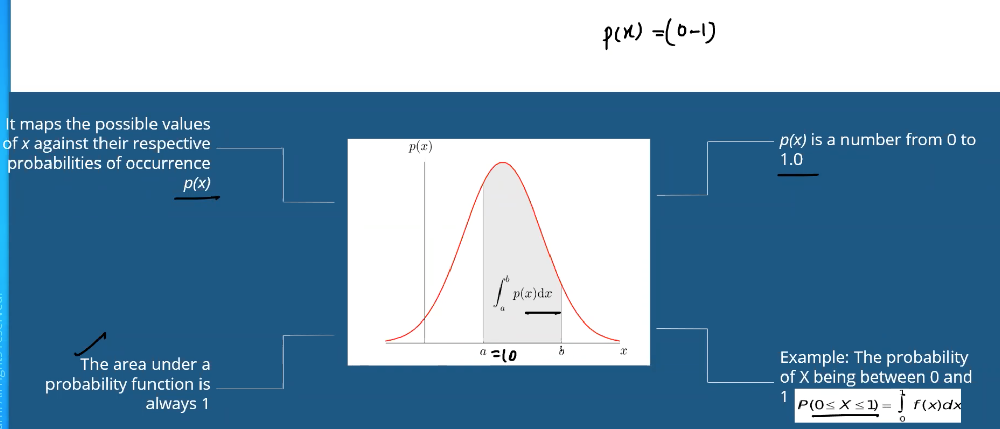



3- Uniform distribution is wher the probablity remain the same /constatnt for all the possible outcome.

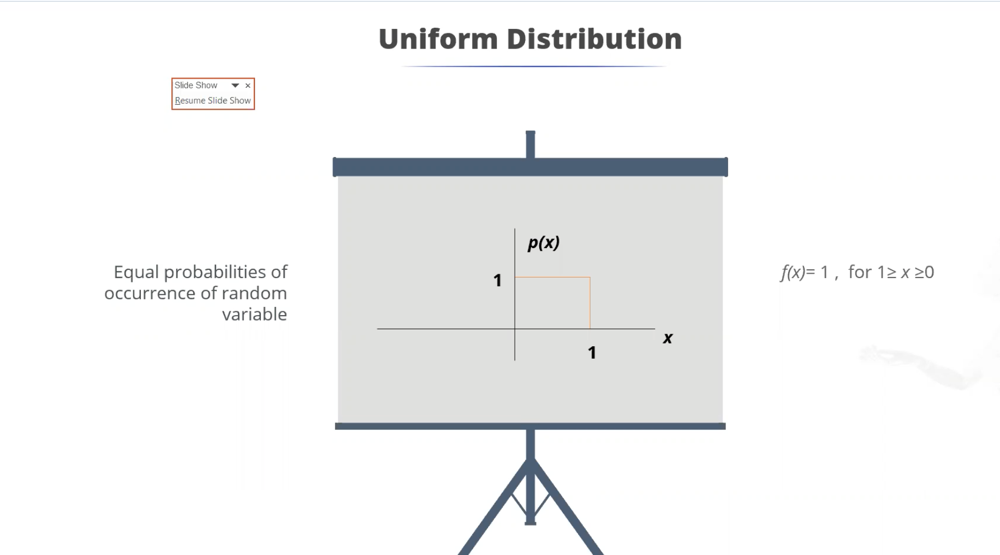





For sample standard distribution is shown with s and for pupulation with sigma 
- Normal distribution , also known as Gausian Distribution


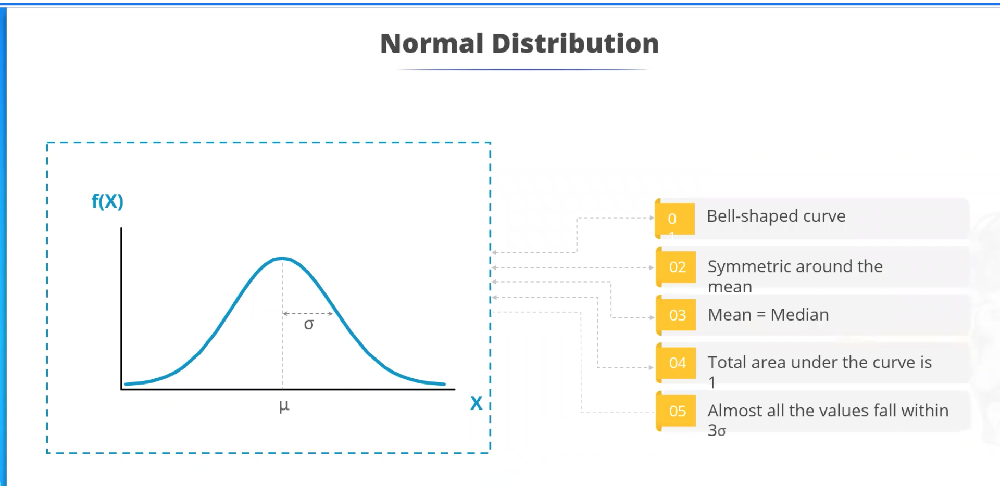


why it is important:
It help us to find about out outliers.


2- Your statistical analysis is based upon this assumption that your sample is normally distributed. 

3- How a norally distributed data is look like:
Main criteria of Noraml Distribution;
A-it has a bell shaped distribution with two tails
B-Distribution will be symmetrical around the mean
C- mean=median = mode
Emperical Rule:

1. approximately 68% of oveall  distributin of data falls with first standard deviation distribution
2. approximately 95% of oveall  distributin of data falls with second standard deviation  distribution ( 2 times of your standrd devision std is called, second std
3. approximately 99.5% of oveall  distributin of data falls with third standard deviation  distribution ( 3 times of your standrd devision std is called, third std
(whatever std you calculated multiply it with 3 is third std.)

in the image below numbes in of x axis are +1σ, +2σ an -1σ and so on.
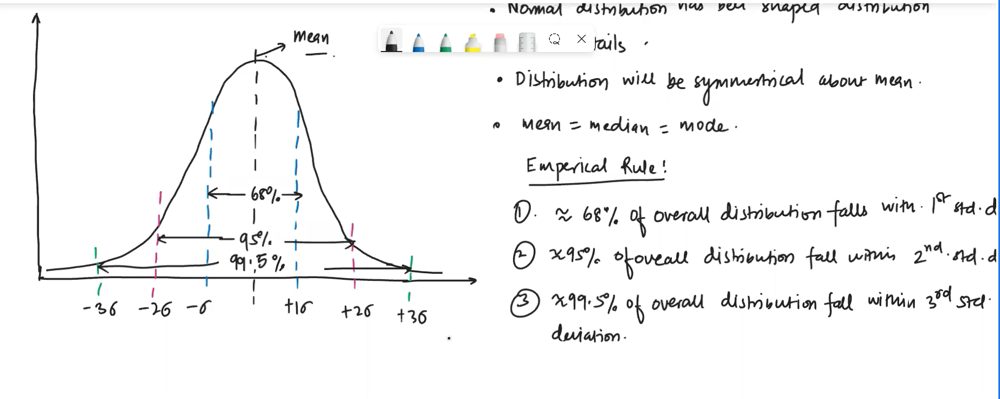



An example:
Lets assume that class standard deviaiotn of a test is done in a class is 10 and class score mean is 60, it is class average score.
Marks scored by a class is noramally distributed data. 
Firs std is 10.
mean - std σ is 50 and mean plus σ is 70. 
what will be the total number of students who marked between 50 to 70? that is the question. What's the probabilty of a student scored marks between 50 to 70? the answer is 68%. 

second std is = 10*2=20
60- 20 = 40 and 60 +20= 80

Probabilty of students marked between 40 to 80 is 95%

third std
10*3= 30
60-30= 30. 60+30=90
99.5% studensts probablity scored markes between 30 to 90.
99.5% of overal percentage of students will score marks between 30 to 09 / likelihood of studenst score marks between 30 to 90 is 0.995, if only and only the marks in a class test is falling the normal distribution pattern, then these criteria apply otherwise you need to calculte area under the curve.

so marks of the students will fall into normall distribution pattern.
Otherwise you need to calculate criteria under the curve.

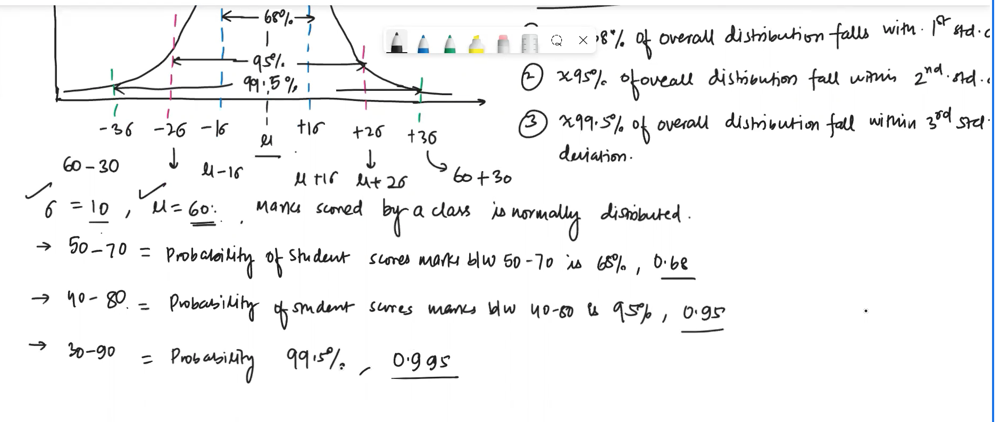

it is one of the continous probablity distribution.
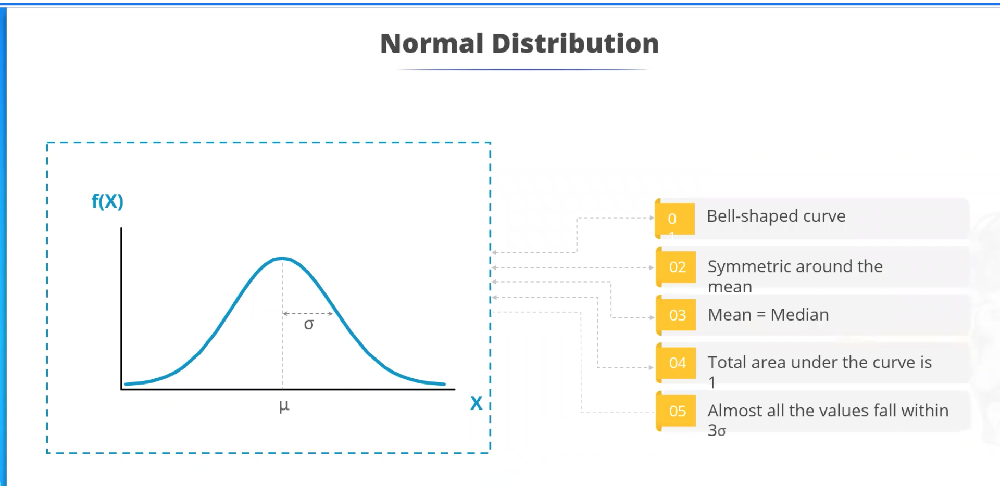


Standard Normal Distribution
Standard Normal Distribution is a transofrmed value. It's standard scaler output. 
it's calculted by zed score formua ( in the line below the fist dash is not minus sign. zed score is used to transform if your data is not normally distrinyted then you can convert it by applying Xi-µ/σ. and it is given by 
z-score=Xi-µ/σ
x is sample.
this is z-score.z-score indocate how many standard deviation away from the mean does the point x lie?
Z-score have their use cases for finding the outliers and it is used to calcualte your standadr normal distribution.
we have different z-score range.
z-score is transformation of data.
Normal standard distribution has the proerty that 
mean = 0, so symmatry is 0. standard devistion is 1. For normal distribution taught up, your meann and standard deviaiotn can be any number like the examples that we see std and mean were different and there was no fixed value for them. But for the noramal standard distribution there is fixed value.


Here plot is not between values. Plot is between standrd deviations. 

Look at the image below. Left side plot is not standard normal distribution. By applyong stndard scalar by using z-score formula, you get normally distributed data with fixed value of mue µ which is 0  and sigma which is zero. It will look like this:

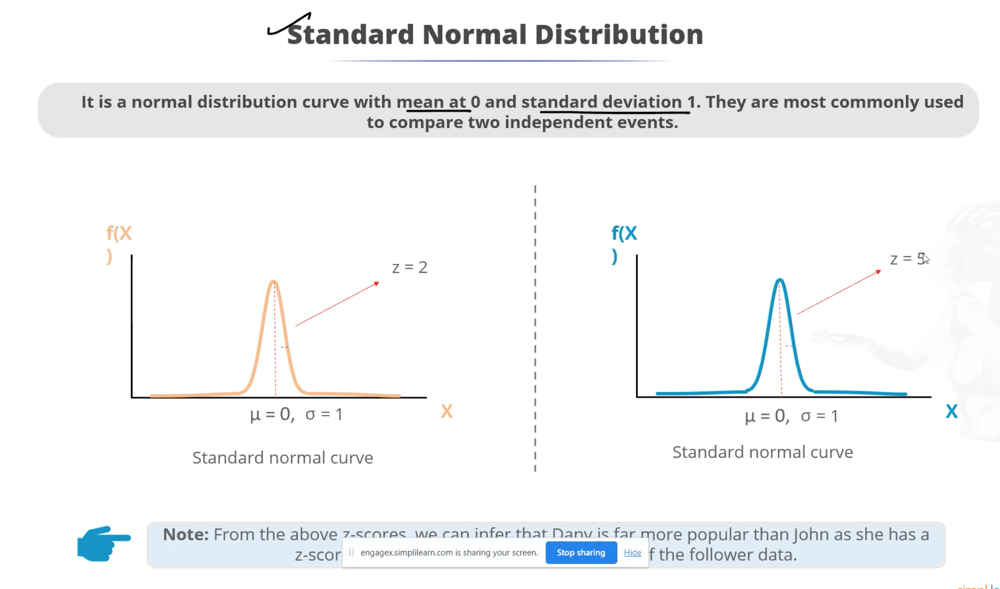

if your z-socre are larger than 3 or smaller than -3, they are considered as outlier or noisy data and deviated data sample, which should not be your normal distribution of data


# Box and Whisker plot
((25%,50%,75% is the amount of distribution of data)
It is used for data visuliaztion and finding outlier. 
In case of noraml distribution. the box will be equally divided by a line. and this line is know as your median.
median is nothing except your 50 percentile value.
Tere is a box and it is denoting our distribution.
 50 percent of overal data distribution is uner median.
 
 by min and max we mean minimum / maximum limit  not min / max values that in summary statistic of python shows up as a result of describe() function. 
[ i guess getting statistical descrpitive of data is another wat showing us outliers. ]
 
 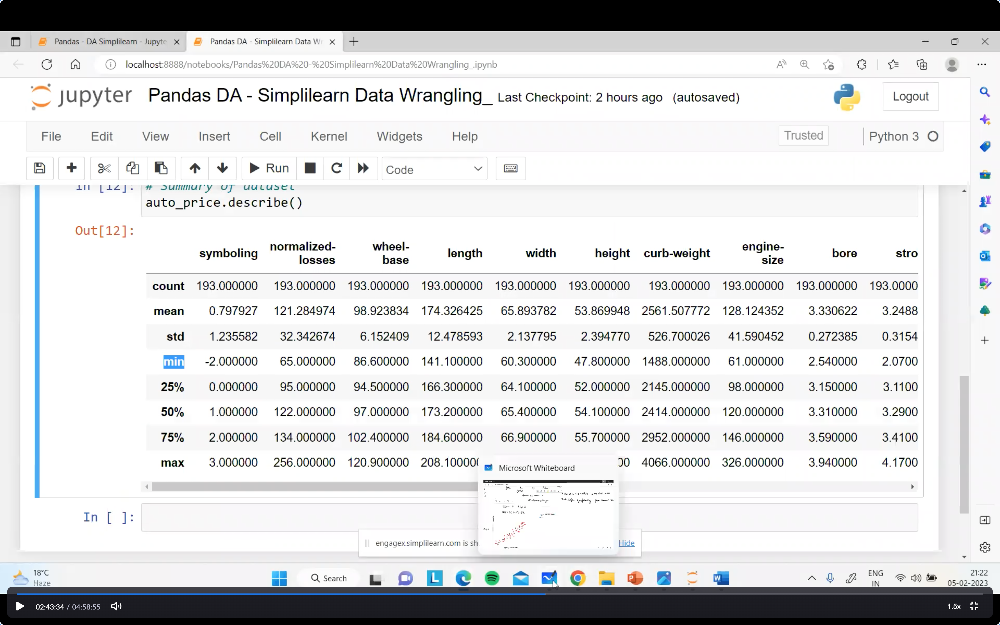
 
 those dots out of box are data outlier.
 
 after you find outliers, either drop it or replace it with mean.
 
 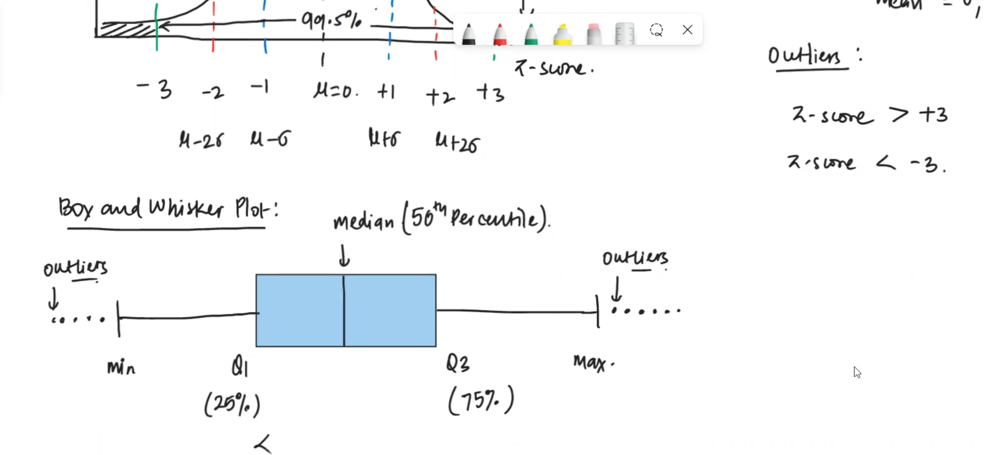
 
 how to find this: by IQR. 
 IQR stands for internal quartile range
 How we use this formula to find the outlier.
 any value beyond min and max value considered as outlier.
 
 quartile 1 or first quarter is mean, which is 25%,  quartile  two or second quarter is median which is 50% and third quartile is 75%. 
 by using quartile 1 and third we find outlier.
 
 in general we have a quarter which is 100%, first qusrter is 25%, second quarter is 50% and so on.
 here is the formula:
 min= Q1 - 1.5*1QR
 max = Q3 +1.5*IQR
 
 
 in data there is certain pattern. if your data is not folloing that pattern they are observed as outlier.
 
 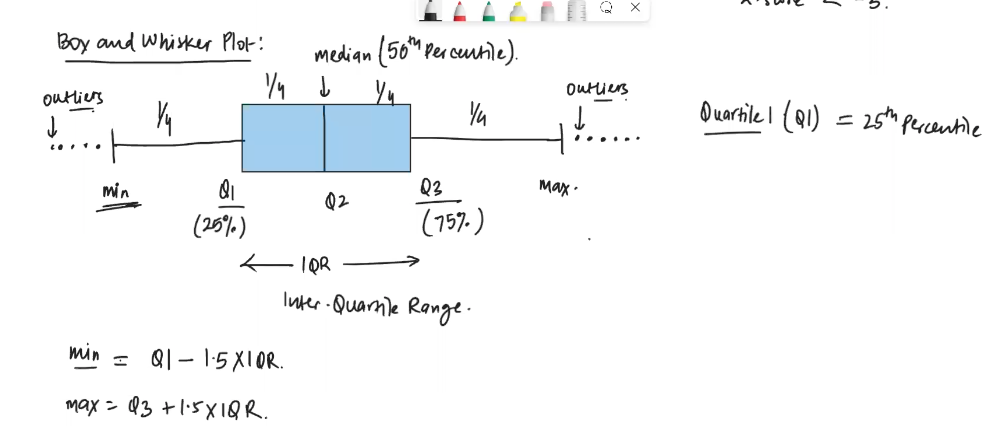
 
 
 in statistic an outlier is an observation that differ significantly form normal observatoin.
 
 a sample of outlier:
 
 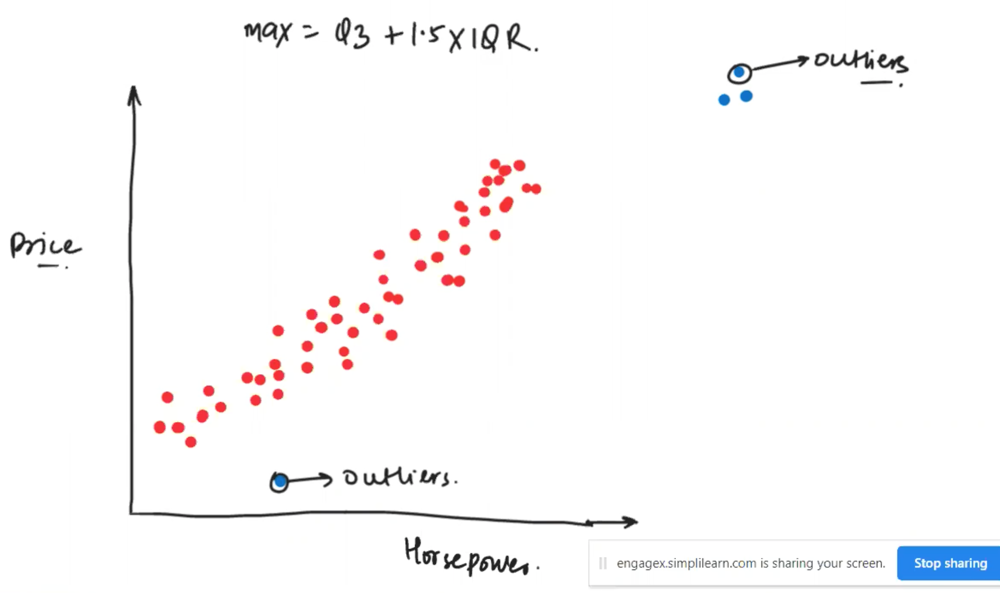
 
 

Outliers

to find the ourlier we have two method. 
1- First one is finding outlier of entire data by z trnsform 
2- the second one is findning the ourlier by using the function, passing the data frame, passing the colum's name 


#to check the Quality distribution of data. Z transformation convert your data to standard  normal distribution and removes outliers.
#  we need to do z transforamtion or standard scalar to find outliers.
#when you apply z score, you find z transformation of data
z-score does this by this formula= Xi-µ/sigma
code for this formula  in python is:
z = np.abs(stats.zscore(auto_price_numerical))
result is z transfomation of your data,in other word, this code shows you your normal and uotliers
to see exactly where the outliers are located use this code:
np.where(z > 3). 3 is criteria you do not need to understand it.
those data that are distributed  between -3 and +3 are normally ditributed beyond -3 and +3 is outliers hence we use z > 3 formula as a methid to find outliers.
hen you can remove your outlier of they are small or replace them with median of your data. 
you’ll find outlier by this process; z-score and z transformation. 



in normal distrubeded data, your data should be distributed between -3 and +3, 99.5% of data is between -3 and +3.

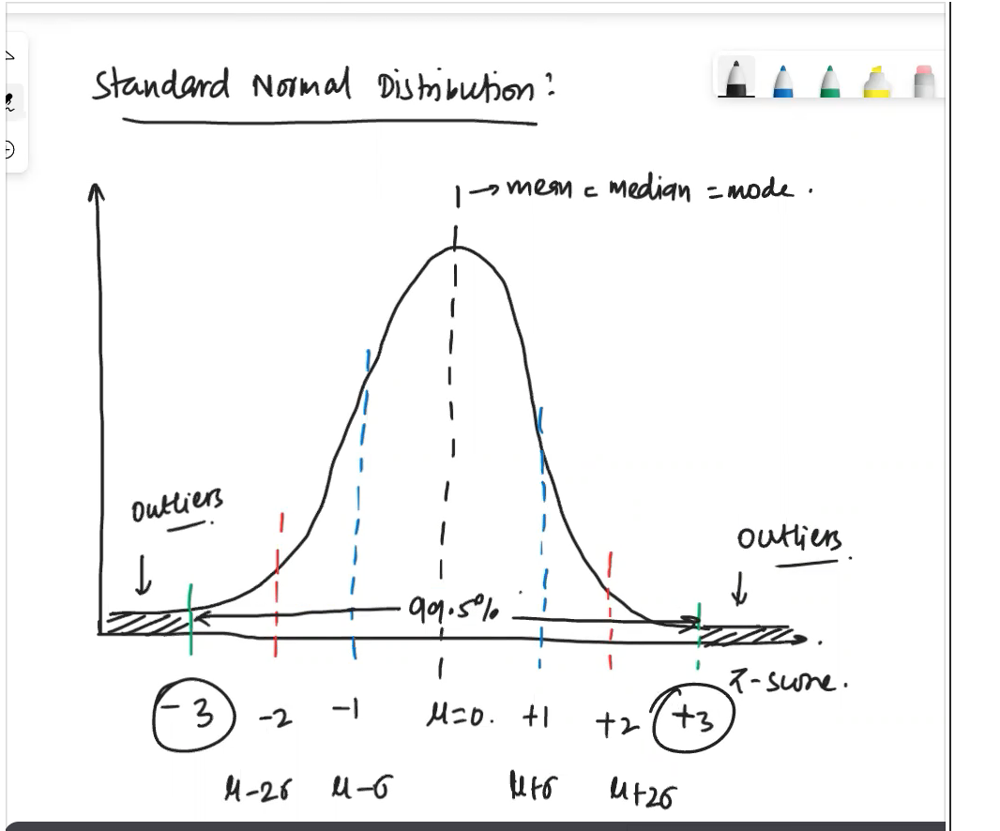

First method of finding the ourlier in entire data

In [30]:
# if your data in not normal you need to do transfomation. 
#scipy - Use for all statistical functions
#stts used to get z-score of my data.

from scipy import stats

In [31]:
auto_price.dtypes

symboling              int64
normalized-losses    float64
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                 float64
stroke               float64
compression-ratio    float64
horsepower           float64
peak-rpm             float64
city-mpg               int64
highway-mpg            int64
price                float64
dtype: object

In [38]:
# in this case I create a data frame that all are numerical. This has to be applied on numerical data not on 
#nonnumercical data.
# select_dtypes() function helps you to include column in the basis of data type.In this case I want the function 
#include 
# int64 and float 64 bit.
# running this code does not show with object data type like 'make' column. 'make' column is not numnerical so I 
#can not apply the 
# whole process that I am doing in here on those data.

auto_price_numerical = auto_price.select_dtypes(include = ['int64','float64'])
auto_price_numerical

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,122.0,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0
1,3,122.0,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0
2,1,122.0,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0
3,2,164.0,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0
4,2,164.0,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95.0,109.1,188.8,68.9,55.5,2952,141,3.78,3.15,9.5,114.0,5400.0,23,28,16845.0
201,-1,95.0,109.1,188.8,68.8,55.5,3049,141,3.78,3.15,8.7,160.0,5300.0,19,25,19045.0
202,-1,95.0,109.1,188.8,68.9,55.5,3012,173,3.58,2.87,8.8,134.0,5500.0,18,23,21485.0
203,-1,95.0,109.1,188.8,68.9,55.5,3217,145,3.01,3.40,23.0,106.0,4800.0,26,27,22470.0


#my qustion form teacher:
    
Why in the code below you are using abs (absolute values) that just shows positive vlaues. How about negarive vaues. 
We do not need to know negative values <-3 to see the outliers. 
in his recording he says no need to check negative part.


In [34]:
# this code shows us the z-score values of all numerical columns. here we are applying z-score formula.
# here teacher's output show the same result showing for my code with different format withour mentioning 
#columns titles
# but his result and mine are same. My output is shwoing z-score values,

#So to see the z-score we apply 'ststs' library, .zcscore() function, and then we simply apply data frame, 
#that is auto_price_numerical in this notebook.

# we call this z transfomtation of data. When you apply z-score, you find z transformation of your data. and your 
#data will be changed. and this code in the two cells below np.where(z > 3) is condition to check your outlier.

z = np.abs(stats.zscore(auto_price_numerical))
z

array([[1.78685028, 0.02216531, 1.68237907, ..., 0.67905347, 0.55705817,
        0.02602522],
       [1.78685028, 0.02216531, 1.68237907, ..., 0.67905347, 0.55705817,
        0.39847973],
       [0.16396979, 0.02216531, 0.72091104, ..., 0.99296322, 0.70413372,
        0.39847973],
       ...,
       [1.4589107 , 0.81481622, 1.65831493, ..., 1.14991809, 1.14536038,
        1.01634519],
       [1.4589107 , 0.81481622, 1.65831493, ..., 0.1057209 , 0.55705817,
        1.13843094],
       [1.4589107 , 0.81481622, 1.65831493, ..., 0.99296322, 0.85120928,
        1.1576424 ]])

In [35]:
# this code shows us which valu's z-score is above +3 and is outlier. In other words, this code shows me outliers.


#when you apply z > 3, I need to find out the index position where exactly my entire outlier exist from the
#overall data.


# My qustion why we choose 3 in the code?

z > 3

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [43]:
# to see the index position of our ouliers we use np.where() functio.
#or we use np.where() function to do that
# in the output just positive numbes are shown up not negative because in the code above 
#I have used absolute values abs. in the code above: 
# which is : z = np.abs(stats.zscore(auto_price_numerical)).  So ther is no negative here. 
#Ther is no need for negative part. If i do not write
#abs. we need to check the negative part.

# in the output, the first array is rows and the second arrays is column indexe position of outlier. 
# whatever is shown in output are outliers, whic are above 3 (>3) and outliers address 

np.where(z > 3)

(array([ 15,  17,  17,  28,  28,  43,  44,  45,  45,  64,  64,  64,  65,
         65,  81,  97, 102, 104, 122, 146, 147, 153, 154, 162, 170, 172,
        175, 178, 180, 191]),
 array([15, 13, 14, 13, 14,  7,  7,  7, 11,  2,  7, 15,  7, 15, 13,  1,  9,
         9,  9, 10, 10, 12, 12, 10, 10, 10, 10,  1, 10, 10]))

In [54]:
# this code shows us just row indexes.

np.where(z > 3)[0]

array([ 15,  17,  17,  28,  28,  43,  44,  45,  45,  64,  64,  64,  65,
        65,  81,  97, 102, 104, 122, 146, 147, 153, 154, 162, 170, 172,
       175, 178, 180, 191])

In [51]:
# my test to see outlier in data

z.head(50)

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,1.786850,0.022165,1.682379,0.444024,0.841263,2.122598,0.025713,0.045215,0.513027,1.808186,0.288273,0.198569,0.213359,0.679053,0.557058,0.026025
1,1.786850,0.022165,1.682379,0.444024,0.841263,2.122598,0.025713,0.045215,0.513027,1.808186,0.288273,0.198569,0.213359,0.679053,0.557058,0.398480
2,0.163970,0.022165,0.720911,0.251195,0.184679,0.615412,0.497764,0.575559,2.394827,0.702918,0.288273,1.334283,0.213359,0.992963,0.704134,0.398480
3,0.975410,1.324137,0.142781,0.182672,0.143612,0.180047,0.427362,0.461021,0.517605,0.480415,0.036204,0.039139,0.856208,0.208189,0.115832,0.082420
4,0.975410,1.324137,0.077596,0.182672,0.237410,0.180047,0.499668,0.189854,0.517605,0.480415,0.540341,0.304217,0.856208,1.149918,1.292436,0.516227
5,0.975410,0.022165,0.142781,0.238914,0.190511,0.322348,0.103758,0.189854,0.517605,0.480415,0.414307,0.172157,0.856208,0.992963,0.851209,0.243549
6,0.163970,1.138141,1.120545,1.476237,2.582351,0.766174,0.537739,0.189854,0.517605,0.480415,0.414307,0.172157,0.856208,0.992963,0.851209,0.548453
7,0.163970,0.022165,1.120545,1.476237,2.582351,0.766174,0.747129,0.189854,0.517605,0.480415,0.414307,0.172157,0.856208,0.992963,0.851209,0.698426
8,0.163970,1.138141,1.120545,1.476237,2.582351,0.849907,0.998398,0.069322,0.738454,0.480415,0.464721,0.964515,0.856208,1.306873,1.586587,1.312574
10,0.975410,2.192117,0.370926,0.198741,0.512971,0.180047,0.316956,0.485128,0.623452,1.426752,0.338686,0.065551,1.497949,0.365144,0.262907,0.389804


We can remove our outluers only if number of our outliers are small.  it there are huge 
we can replace them by median values.

#### Treating Outliers
    * Remove/Trim the Outliers
    * Replace Outliers by Mean/Median

Second method to figure out the outliers of the individula columns. 

In [68]:
# Visualization

import matplotlib.pyplot as plt
import seaborn as sns

"""

. 
 in normal distribution your data has a median that divide the box into two halves. But what if your data is not normally distributed, in that case, your data is considered to be skewed .

we have different types of skewness:
 1- Positive skewness in which distribution / tail / is toward positive side.
in the positive skewness, median line does not divid distribution equally.
there will be chance of outier toward the positive side.
2- negative skewness which is opposit with the positive skewness

3- symmetrical distribution or symmatry
. in which data is normally distributed.
"""


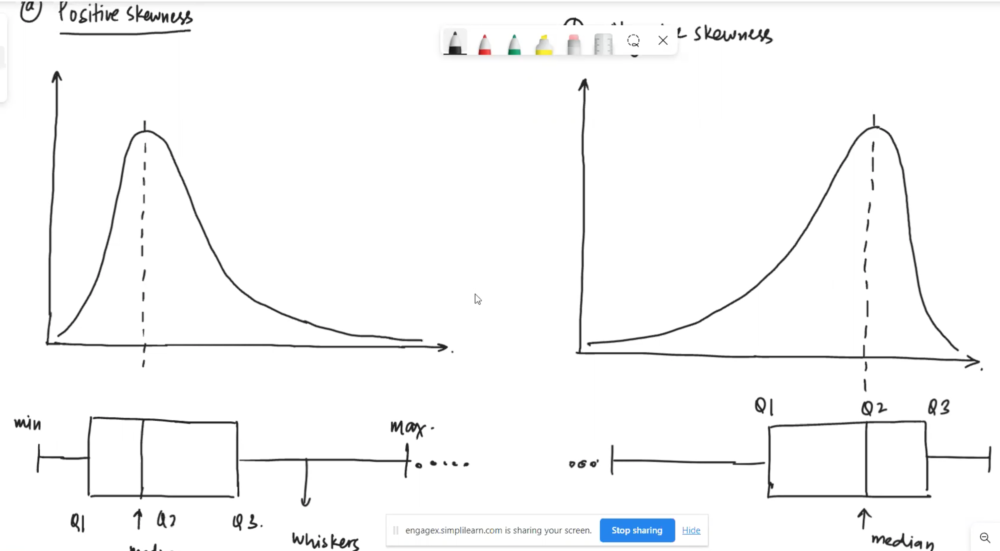

<AxesSubplot:xlabel='price'>

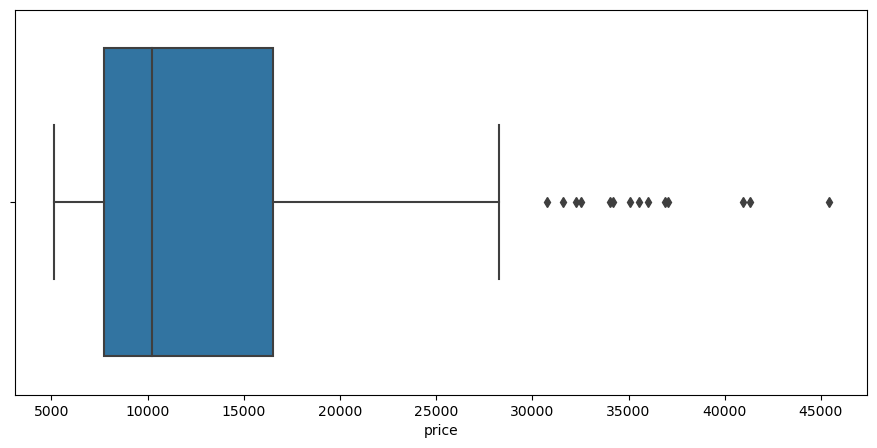

In [59]:
#we need here to create a plot for boxplot that we talked about in the cells above outliers.
#Height , Width of Plot (11,5) => Height & Width of Plot
# this type of plot that is boxplot written in this code is done by seaborn library mentioned in the code above. 
#and 
# matplotlib library is for basic plot
# to make a plot we need to take a function, i picked boxplot here.
# .figure() increases hight and width of plot. then we provide our column's name.
# finding outlier for column price via boxplot:

#Insight: and here is our plot.
#black dots are outliers and skew is positive skew. 

plt.figure(figsize = (11,5))
sns.boxplot(x = 'price', data = auto_price)

whatever we do in the cells below is doning whatever is said in the theory in the image below. We are doing all 
the calculations mentioned in the theory here by using python codes in the cells below


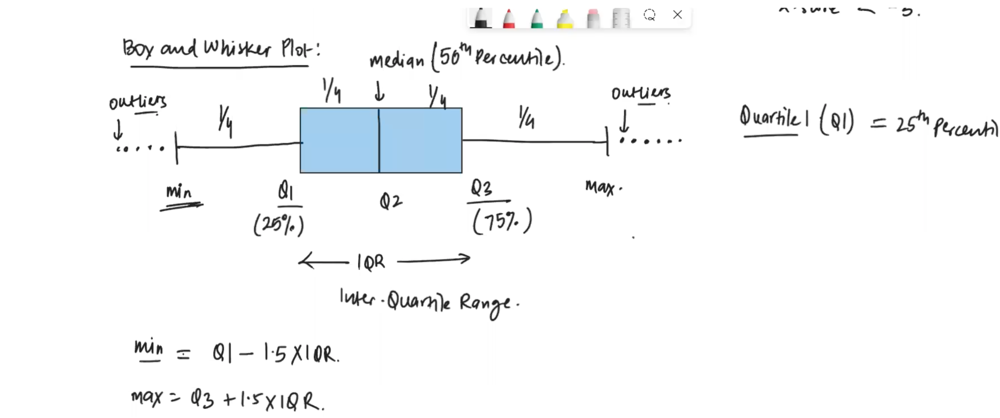

In [69]:
# .quantile() is a direct function that will take probability distribution value, quantile is quartile do not get confused.
# q2 is median.
#Q3 is quartile third or quantile .75
q1 = auto_price['price'].quantile(.25)
q3 = auto_price['price'].quantile(.75)

In [66]:
#in this method we need to get q1, q3, calculae IQR.
def find_outliers(df, cols):
    q1 = df[cols].quantile(.25)
    q3 = df[cols].quantile(.75)
    iqr = q3 - q1
    min_r = q1 - 1.5*iqr
    max_r = q3 + 1.5*iqr
    outliers_indices = df.index[(df[cols] < min_r) | (df[cols] > max_r)]
    return outliers_indices

In [67]:
# To find outlier of row indexes to see where outliers exist.
# result is the row indexes.
find_outliers(auto_price, 'price')

Int64Index([15, 16, 17, 47, 48, 49, 70, 71, 72, 73, 74, 126, 127, 128], dtype='int64')

In [70]:
# we can do the same code for other columns like
find_outliers(auto_price, 'horsepower')

Int64Index([49, 105, 126, 127, 128], dtype='int64')